works with the HMF files 

## Load dependences and setting output configuration

In [1]:
import numpy as np
from keras.utils.np_utils import to_categorical
import keras
%pylab inline
%load_ext autoreload
%autoreload 2

Using TensorFlow backend.


Populating the interactive namespace from numpy and matplotlib


## Load data from npy files

In [2]:
datapath='F:/1_GTCG/data/HMF_ChannelMaker_110418.tar/HMF_ChannelMaker_110418/'
datapath_labels = 'F:/1_GTCG/data/HMF_ChannelMaker_110418.tar/HMF_labels_040418/'
filename = '_channel_maker_real.npy'

In [3]:
i=1
data =np.load(datapath + str(i) + filename)
labels = np.load(datapath_labels + str(i) + '_labels.npy') 
X_test=data[np.where(labels != 'no_del')]
y_test = labels[np.where(labels != 'no_del')]
#X_test = X_test[:, [0,1,2,11,12,13], :]
data = []
labels = []

In [4]:
for i in range(2,23):
        data =np.load(datapath + str(i) + filename)
        labels = np.load(datapath_labels + str(i) + '_labels.npy') 
        X_test_partial=data[np.where(labels != 'no_del')]
        y_test_partial = labels[np.where(labels != 'no_del')]
        data = []
        labels = []
        #X_test_partial= X_test_partial[:, [0,1,2,11,12,13], :]#only the 6 channels: coverage and clipped ends
        X_test = np.concatenate((X_test, X_test_partial))
        y_test = np.concatenate((y_test, y_test_partial))
        

## Save the SVs only

In [5]:
np.save(datapath + 'X_allSVs_22channels.npy', X_test)
np.save(datapath + 'y_allSVs_22channels.npy', y_test)

### Load the SV files

In [41]:
X=np.load(datapath + 'X_allSVs_22channels.npy')
y=np.load(datapath + 'y_allSVs_22channels.npy')

In [7]:
X.shape

(891, 22, 200)

In [8]:
y.shape

(891,)

### Number of channels

In [32]:
number_channels = X.shape[1]
number_channels

22

In [42]:

X_train = X[0:600]
y_train = y[0:600]
X_val = X[600:750]
y_val = y[600:750]
X_test = X[750:]
y_test = y[750:]

## Normalize data 

In [43]:

coverage = np.median(X_train[:, 11, :]) #the median of the coverage in the normal cells

In [44]:
expected_distance = 150
def normalize(X):       
    for i in range (0, len(X)):
        for j in range(0,number_channels):                                                                             
            X[i][j] = np.divide(X[i][j], coverage)*100
        for k in [3,4,5,6,14,15,16,17]:#the distance channels
            X[i][k] = np.divide(X[i][k], expected_distance)


normalize(X_train)
normalize(X_val)
normalize(X_test)

In [45]:
coverage

34.0

## Plots several  windows 

In [50]:
n_windows = 600
label = ["None"] * number_channels

In [53]:
label[0] = "tumor:coverage"
label[1] = "tumor:#left clipped reads"
label[2] = "tumor:#right clipped reads"
label[3] = "tumor:distance forward orientation left clipped"
label[4] = "tumor:distance forward orientation right clipped"
label[5] = "tumor:distance reverse orientation left clipped"
label[6] = "tumor:distance reverse orientation right clipped"
label[7] = "tumor:#split reads left split"
label[8] = "tumor:#split reads right split"
label[9] = "tumor:split read distance left split"
label[10] = "tumor:split read distance right split"

In [54]:
label[0+11] = "normal:coverage"
label[1+11] = "normal:#left clipped reads"
label[2+11] = "normal:#right clipped reads"
label[3+11] = "normal:distance forward orientation left clipped"
label[4+11] = "normal:distance forward orientation right clipped"
label[5+11] = "normal:distance reverse orientation left clipped"
label[6+11] = "normal:distance reverse orientation right clipped"
label[7+11] = "normal:#split reads left split"
label[8+11] = "normal:#split reads right split"
label[9+11] = "normal:split read distance left split"
label[10+11] = "normal:split read distance right split"

In [56]:
from numpy import *
import math
import matplotlib.pyplot as plt


def plot_channels(start_window, n_windows):
    for i in range (start_window, start_window + n_windows, 3):
        #print(y_train[i], 'id:', i)
        for j in range (0, number_channels):        
            shift = 0
            start =0
            if j in [0,11]:
                shift = -100
            if j > 10:
                start = -60
            Z = [start + shift + 300 + x - 5*j*4 for x in X_train[i][j]]  
            #plt.ylim([100,600])
            if j>10:
                plt.plot(Z, label = label[j], linestyle=':', linewidth=2)
            else:
                plt.plot(Z, label = label[j])
        
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., prop={'size': 10})    
        plt.show()

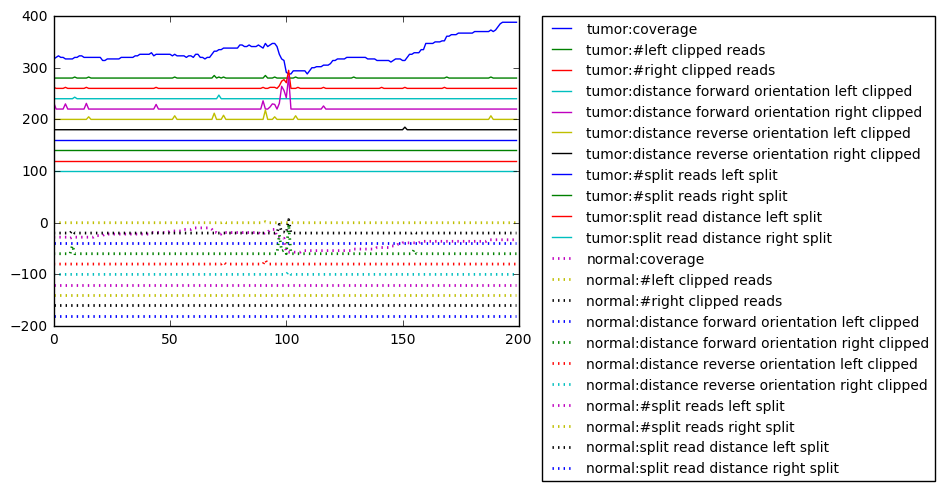

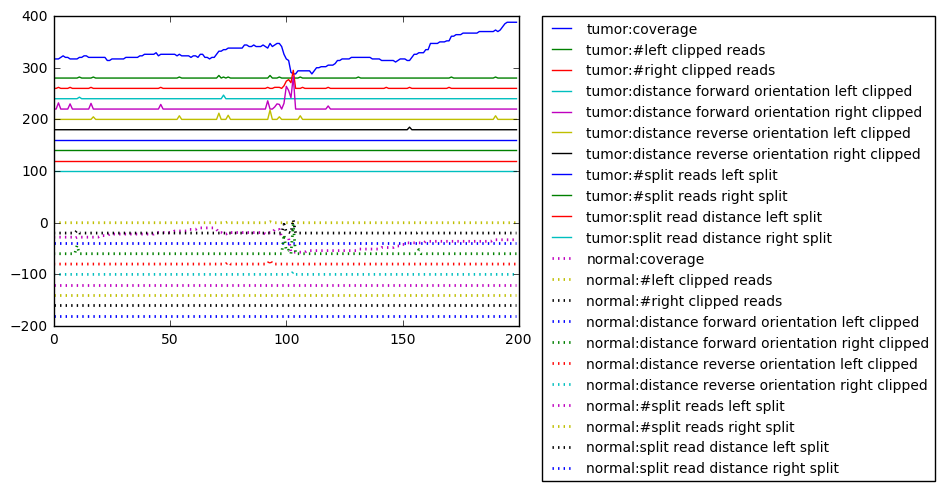

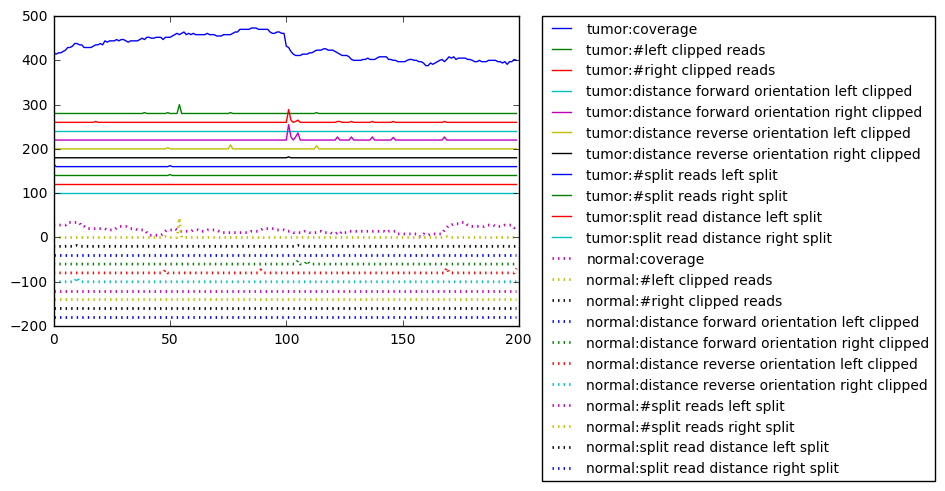

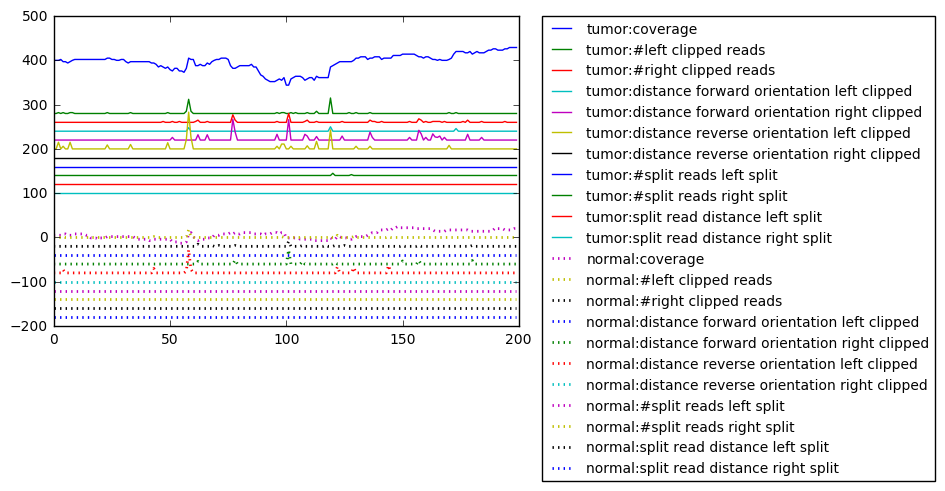

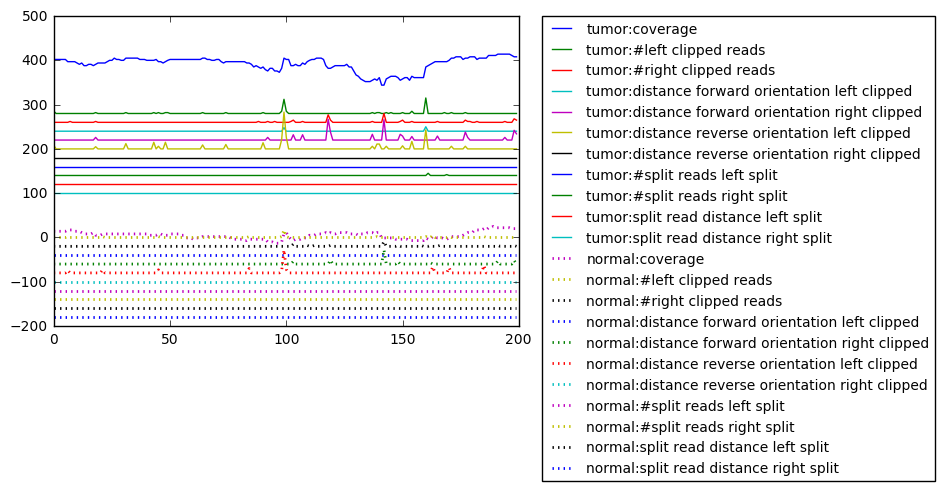

...

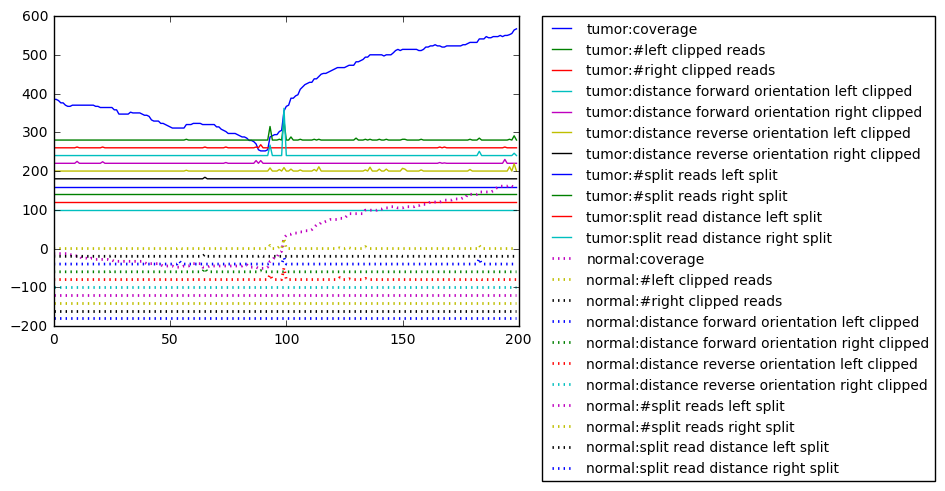

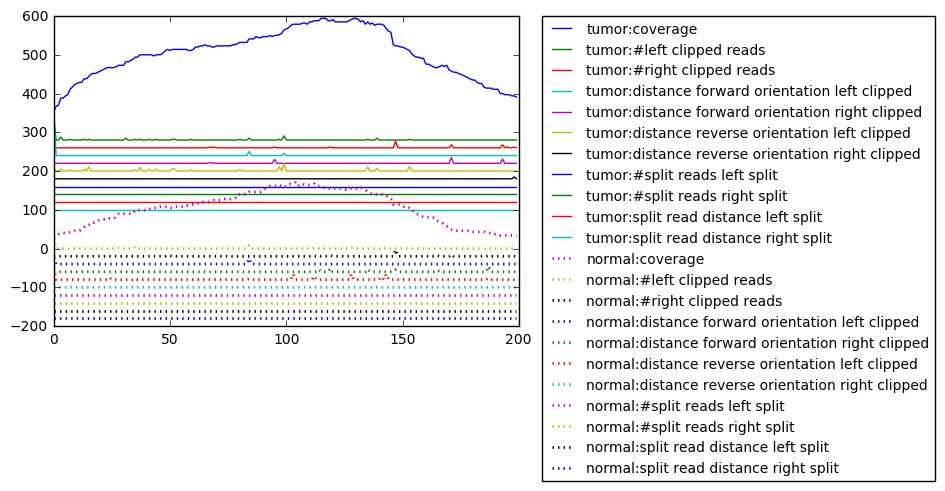

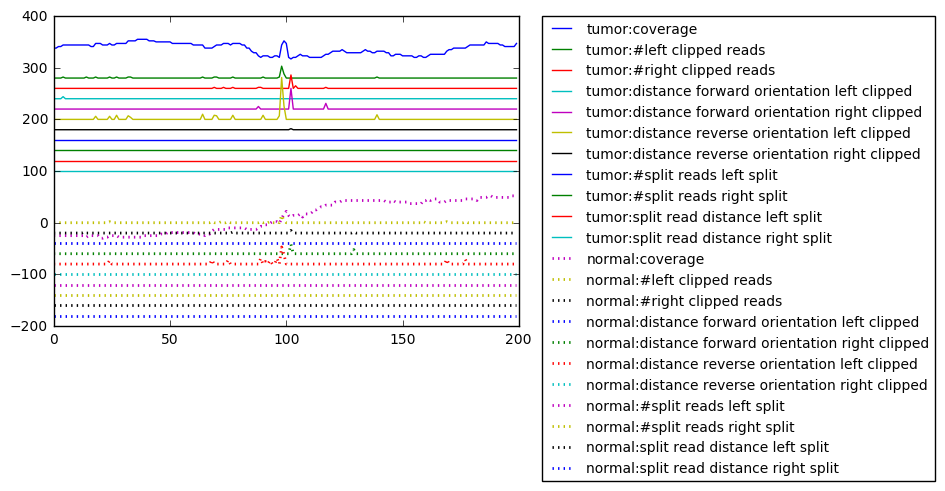

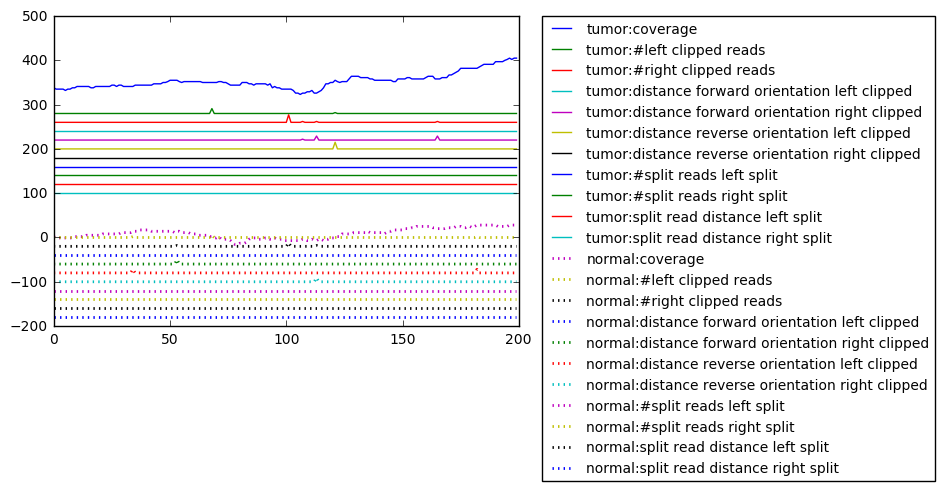

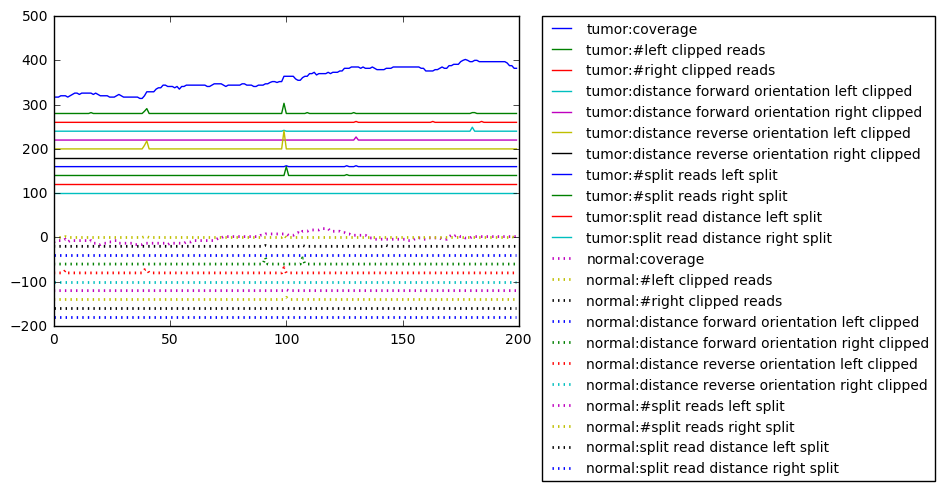

In [57]:
start_window = 0

plot_channels(start_window, n_windows)

   
## Transposes every window in X, to comply to McFly format

In [77]:
def transposeDataset(X):
    image = []
    for i in range (0, len(X -1)):
        tr = X[i].transpose()
        image.append(tr)
    return np.array(image)

image1 = transposeDataset(X_train)
image2 = transposeDataset(X_val)
image3 = transposeDataset(X_test)
X_train = image1
X_val = image2
X_test = image3

n_channels = len(X_train[0][0])
print(len(X_test[0][0]))

6


## Prepare the labels in McFly format

In [78]:
classlabels = list(set(y_train))
mapclasses = {classlabels[i] : i for i in range(len(classlabels))}
print(mapclasses)

y_train = np.array([mapclasses[c] for c in y_train], dtype='int')
y_val = np.array([mapclasses[c] for c in y_val], dtype='int')
y_test = np.array([mapclasses[c] for c in y_test], dtype='int')
y_train_binary = to_categorical(y_train)
y_val_binary = to_categorical(y_val)
y_test_binary = to_categorical(y_test)

{'del_start': 0, 'del_end': 1}


In [38]:
y_test_binary

array([[ 0.,  1.],
       [ 1.,  0.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 1.,  0.],
       [ 0.,  1.],
       [ 1.,  0.],
       [ 0.,  1.],
       [ 1.,  0.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 1.,  0.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 0.,  1.],
       [ 1.,

## Generate neural networks architectures

In [79]:
from keras.models import Sequential
from keras.layers import Dense, Activation, Convolution1D, Flatten, MaxPooling1D
from keras.optimizers import Adam
import sys
import os
import numpy as np
sys.path.insert(0, os.path.abspath('..'))
from mcfly import modelgen, find_architecture

In [80]:
np.random.seed = 321
num_classes = y_train_binary.shape[1]

In [100]:
%%time
models = modelgen.generate_models(X_train.shape,
                                  num_classes,
                                  number_of_models = 1,
                                  model_type = 'CNN',
                                  cnn_min_layers=1,
                                  cnn_max_layers=1,
                                  cnn_min_fc_nodes=4, 
                                  cnn_max_fc_nodes=6,
                                  low_lr=4, high_lr=4)

Wall time: 841 ms


In [101]:
%%time
for model, params, model_types in models:
    print(params)
    model.summary()

{'fc_hidden_nodes': 6, 'filters': array([45]), 'learning_rate': 0.0001, 'regularization_rate': 0.02464882106672407}
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
batch_normalization_19 (Batc (None, 200, 6)            24        
_________________________________________________________________
conv1d_7 (Conv1D)            (None, 200, 45)           855       
_________________________________________________________________
batch_normalization_20 (Batc (None, 200, 45)           180       
_________________________________________________________________
activation_19 (Activation)   (None, 200, 45)           0         
_________________________________________________________________
flatten_7 (Flatten)          (None, 9000)              0         
_________________________________________________________________
dense_13 (Dense)             (None, 6)                 54006     
__________________________

## Train the networks

In [96]:
train_set_size = X_train.shape[0]
train_set_size

600

In [103]:
%%time
histories, val_accuracies, val_losses = find_architecture.train_models_on_samples(X_train, y_train_binary,
                                                                                 X_val, y_val_binary,
                                                                                 models,nr_epochs=1, 
                                                                                  subset_size=train_set_size,
                                                                                  verbose=True)

Training model 0 CNN
Train on 600 samples, validate on 150 samples
Epoch 1/1
600/600 [==============================] - 1s 1ms/step - loss: 1.8409 - acc: 0.6283 - val_loss: 1.8636 - val_acc: 0.6133
Wall time: 689 ms


## Plot training process

Currently run with a very low number of epochs

In [ ]:
%%time
for i in range(len(models)):
    name = str(models[i][1])
    find_architecture.plotTrainingProcess(histories[i], name)

In [ ]:
#%%time
import pandas as pd
results = pd.DataFrame({'model':[str(params) for model, params, model_types in models],
                       'train_acc': [history.history['acc'][-1] for history in histories],
                       'train_loss': [history.history['loss'][-1] for history in histories],
                       'val_acc': [history.history['val_acc'][-1] for history in histories],
                       'val_loss': [history.history['val_loss'][-1] for history in histories]
                       })
results

## Take the best current model 

In [138]:
best_model_index = np.argmax(val_accuracies)

In [139]:
best_model, best_params, best_model_types = models[best_model_index]
print(best_model_index, best_model_types, best_params)

0 CNN {'regularization_rate': 0.013105109369632079, 'fc_hidden_nodes': 5, 'filters': array([47]), 'learning_rate': 0.0001}


## Save the best current model

In [140]:
from keras.models import load_model

model_path = os.path.join('F:/CNN/notebooks/', 'HMF_3_6channels')

best_model.save(model_path)

## Reload the best current model

In [141]:

model_reloaded = load_model(model_path)

## Test best current model on testset

### Overall accuracy on the test set:

In [142]:
score_test = model_reloaded.evaluate(X_test, y_test_binary, verbose=False)
print('Test loss and accuracy of best model: ' + str(score_test))

Test loss and accuracy of best model: [1.6621245830617053, 0.53900709262130952]


### Re-check the train and validation scores: 

In [ ]:
best_model.get_config()[0]

In [ ]:
score_train = model_reloaded.evaluate(X_train, y_train_binary, verbose=False)
print('Train Score of best model: ' + str(score_train))

In [ ]:
score_val = model_reloaded.evaluate(X_val, y_val_binary, verbose=False)
print('Val Score of best model: ' + str(score_val))